# Train a model with focal samples
The previous model was trained with all human labelled samples. These weren't necessarily the most clear, focal samples in the recording. We've used this model to detect additional target species vocalizations from further into the recordings, and sorted them by recognizer score. This produced an additional set of samples to train a model with.

In [1]:
wandb_description = "Model trained on 1000 focal present and 1000 absent samples."

In [2]:
# !pip install wandb
# ! pip install wandb --upgrade

In [3]:
# imports
import wandb
from pathlib import Path
import sys
import pandas as pd
BASE_PATH = Path.cwd().parent.parent
sys.path.append(str(BASE_PATH))
from src.utils import plot_locations, keep_cols, show_sample_from_df, inspect_input_samples, get_binary_targets_scores, show_samples_in_df
# import src.data
# import src.data.build
import opensoundscape as opso
from opensoundscape.preprocess.utils import show_tensor, show_tensor_grid
import numpy as np
# import hashlib
model_save_path = BASE_PATH / 'models'
import matplotlib.pyplot as plt
# import torch
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import ipywidgets as widgets
from ipywidgets import interact


%load_ext autoreload
%autoreload 2



/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:18: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [4]:
# If training on a Mac:
%env PYTORCH_ENABLE_MPS_FALLBACK 0

env: PYTORCH_ENABLE_MPS_FALLBACK=0


# Set some hyperparameters

In [5]:
random_seed = 42
learning_rate = 0.001
epochs=10

### DataFrame (df): The primary Pandas data structure. Used for containing and manipulating 2 dimensional data (data with rows and cols).

In [11]:
# load training and validation dataframes
data_path = Path.cwd().parent.parent / "data"
train_df = pd.read_pickle(data_path / "interim" / "train_set" / "balanced_train_set_verified.pkl")
train_focal = pd.read_pickle(data_path / "interim" / "train_set" / "train_focal.pkl")
valid_df = pd.read_pickle(data_path / "interim" / "valid_set" / "balanced_valid_set_verified.pkl")

present = train_df.loc[train_df.target_present == 1.0]
absent = train_df.loc[train_df.target_present == 0.0]

train_df.head()
train_focal.head()

predicted  \
file                                               start_time end_time              
../../data/raw/recordings/OSFL/recording-100136... 118.5      121.5      0.991321   
../../data/raw/recordings/OSFL/recording-100138... 76.5       79.5       0.994632   
                                                   78.0       81.0       0.993721   
                                                   97.5       100.5      0.989735   
                                                   109.5      112.5      0.993440   

                                                                        target_present  \
file                                               start_time end_time                   
../../data/raw/recordings/OSFL/recording-100136... 118.5      121.5                1.0   
../../data/raw/recordings/OSFL/recording-100138... 76.5       79.5                 1.0   
                                                   78.0       81.0                 1.0   
                                                   97.5       100.5                1.0   
                                                   109.5      112.5                1.0   

                                                                        confidence_cat  \
file                                               start_time end_time                   
../../data/raw/recordings/OSFL/recording-100136... 118.5      121.5                  3   
../../data/raw/recordings/OSFL/recording-100138... 76.5       79.5                   1   
                                                   78.0       81.0                   4   
                                                   97.5       100.5                  4   
                                                   109.5      112.5                  3   

                                                                            loss  
file                                               start_time end_time            
../../data/raw/recordings/OSFL/recording-100136... 118.5      121.5     0.008679  
../../data/raw/recordings/OSFL/recording-100138... 76.5       79.5      0.005368  
                                                   78.0       81.0      0.006279  
                                                   97.5       100.5     0.010265  
                                                   109.5      112.5     0.006560

### Dataset (ds): PyTorch lingo for a pairing of the inputs with the targets.
The only feature needed for training alongside the input spectrogram is the present / absent label. So we can drop the remaining columns from the dataframe to make things neater. 

In [7]:
# Create datasets
train_ds = train_df[['target_present']]
valid_ds = valid_df[['target_present']]
train_ds.head()

,,,target_present
file,start_time,end_time,
../../data/raw/recordings/OSFL/recording-552669.flac,1.5,4.5,1.0
../../data/raw/recordings/OSFL/recording-293797.mp3,6.0,9.0,1.0
../../data/raw/recordings/OSFL/recording-825368.flac,0.0,3.0,1.0
../../data/raw/recordings/OSFL/recording-292426.mp3,6.0,9.0,1.0
../../data/raw/recordings/OSFL/recording-555131.flac,10.5,13.5,1.0


In [8]:
train_ds.value_counts()

target_present
0.0               1000
1.0               1000
Name: count, dtype: int64

# Define a model architecture to train. 

In [9]:
# Create a CNN object designed to recognize 3-second samples
from opensoundscape import CNN

# Use resnet18 (faster) or resnet34 architecture
architecture = 'resnet34'

# Can use this code to get your classes, if needed
class_list = list(train_ds.columns)

model = CNN(
    architecture = architecture,
    classes = class_list,
    sample_duration=3,
    
)

# Single target means that there can only be one label present at any time. For multi class problems this could be set to true or false depending on whether there are multiple simultaneous labels. For binary problem it should be set to false to enable sigmoid activation at the final layer. 
model.single_target = False
model.optimizer_params['lr'] = learning_rate

model.classes

['target_present']

Look at some samples from the database. There will probably be some mis-labelled samples in here, but we should see plenty of the target species vocalization too. 

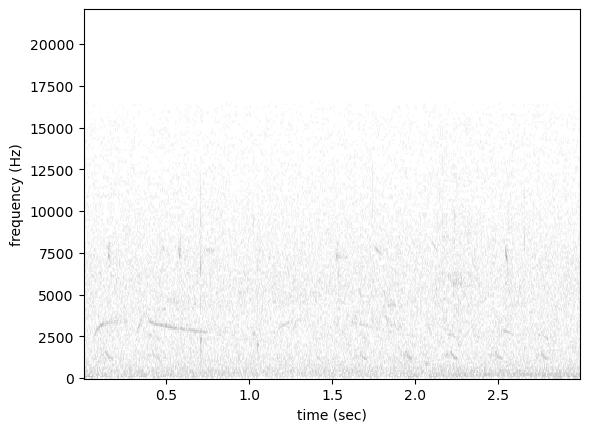

In [10]:
# ctrl + enter to cycle through samples from the dataset. Choose present or absent. 
show_sample_from_df(train_ds, label='present')

In [11]:
# Make sure you're using the GPU - it should say 'cuda' if you are on a pc and 'mps' on a mac. 
print(f'model.device is: {model.device}')

model.device is: mps


# Weights & Biases initialization
Weights and biases is used to track the progress during model training, and to compare different models with one-another. 

In [34]:
# Passing in the name of the current notebook here.
%set_env WANDB_NOTEBOOK_NAME={Path.cwd()}/3-train-a-small-model

wandb.login()

wandb_session = wandb.init(

    project='OSFL',
    notes=wandb_description,
    config={
    "epochs":epochs,
    "random_seed": random_seed}
)
wandb.config.learning_rate = learning_rate

wandb: WARNING WANDB_NOTEBOOK_NAME should be a path to a notebook file, couldn't find /Users/mikeg/code/machine_learning/osfl_cnn_recognizer/notebooks/presentation_nbs/3-train-a-small-model.


env: WANDB_NOTEBOOK_NAME=/Users/mikeg/code/machine_learning/osfl_cnn_recognizer/notebooks/presentation_nbs/3-train-a-small-model


wandb: Currently logged in as: mgallimore88. Use `wandb login --relogin` to force relogin
/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/wandb/sdk/lib/ipython.py:77: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import HTML, display  # type: ignore


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

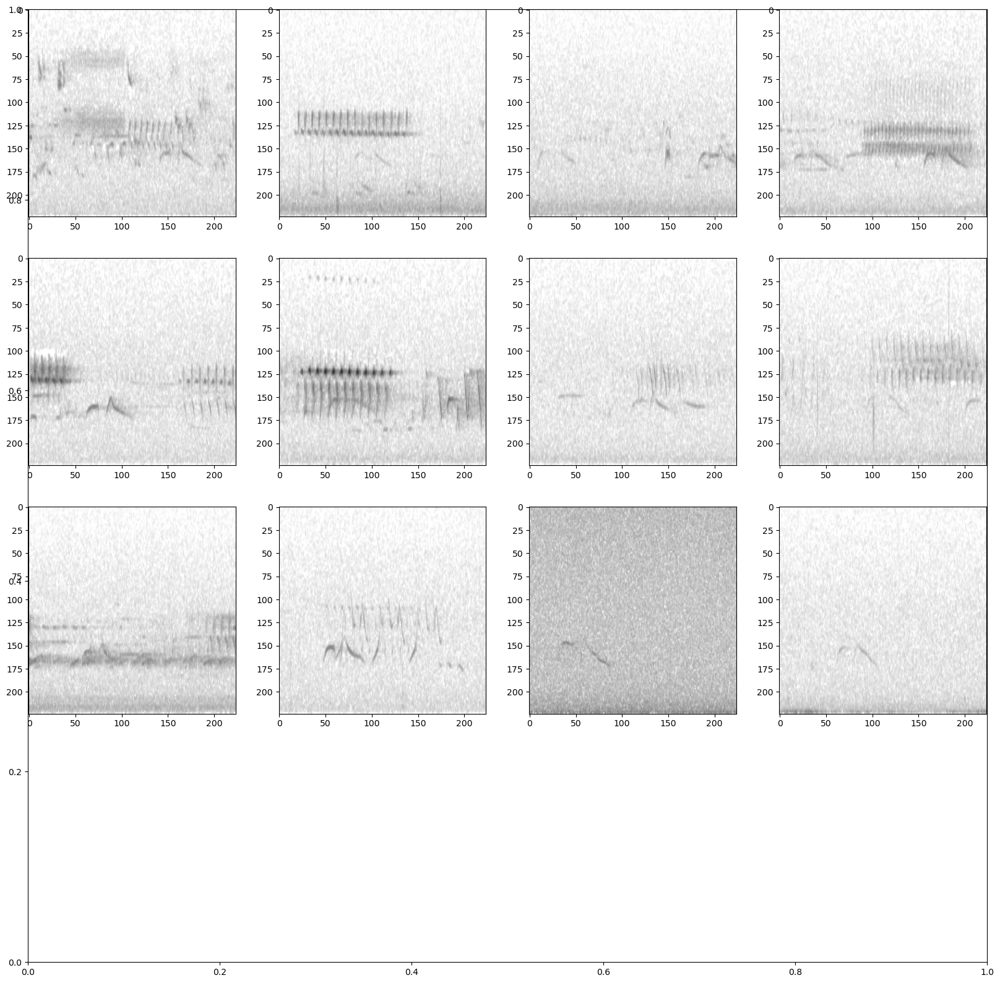

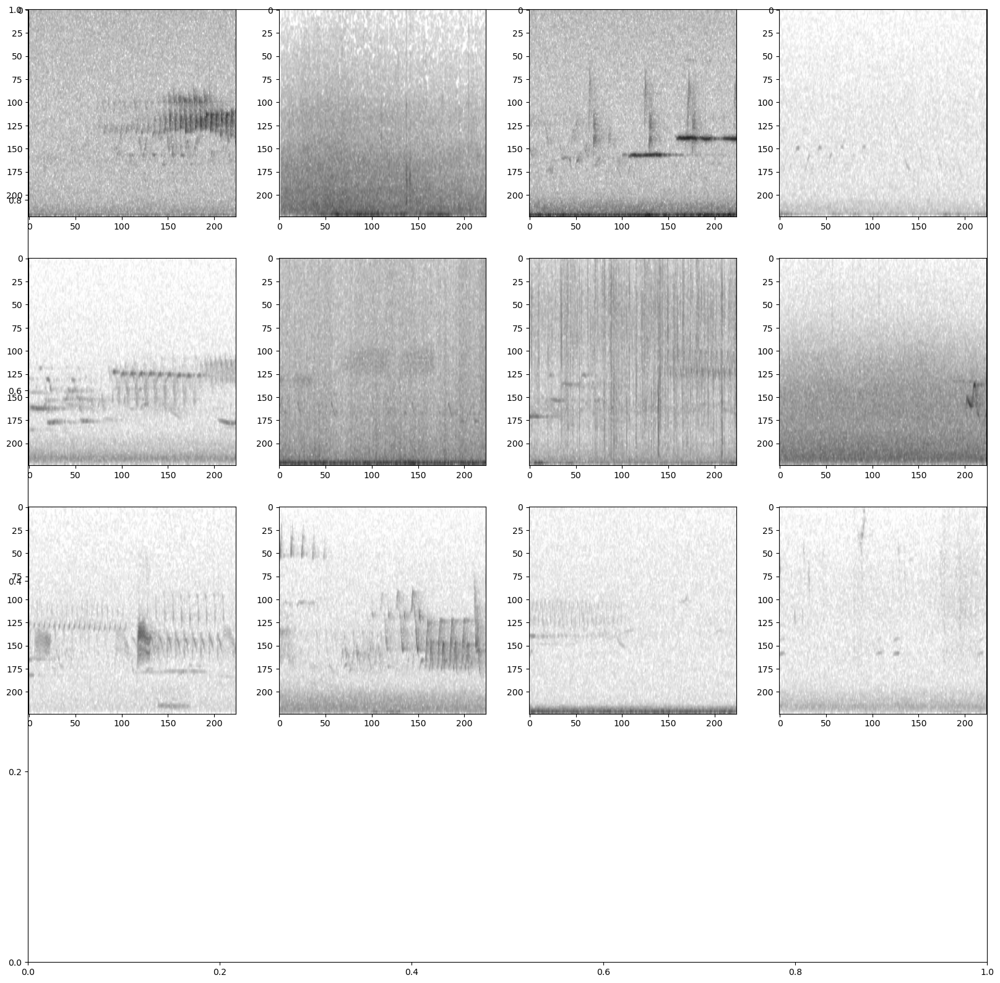

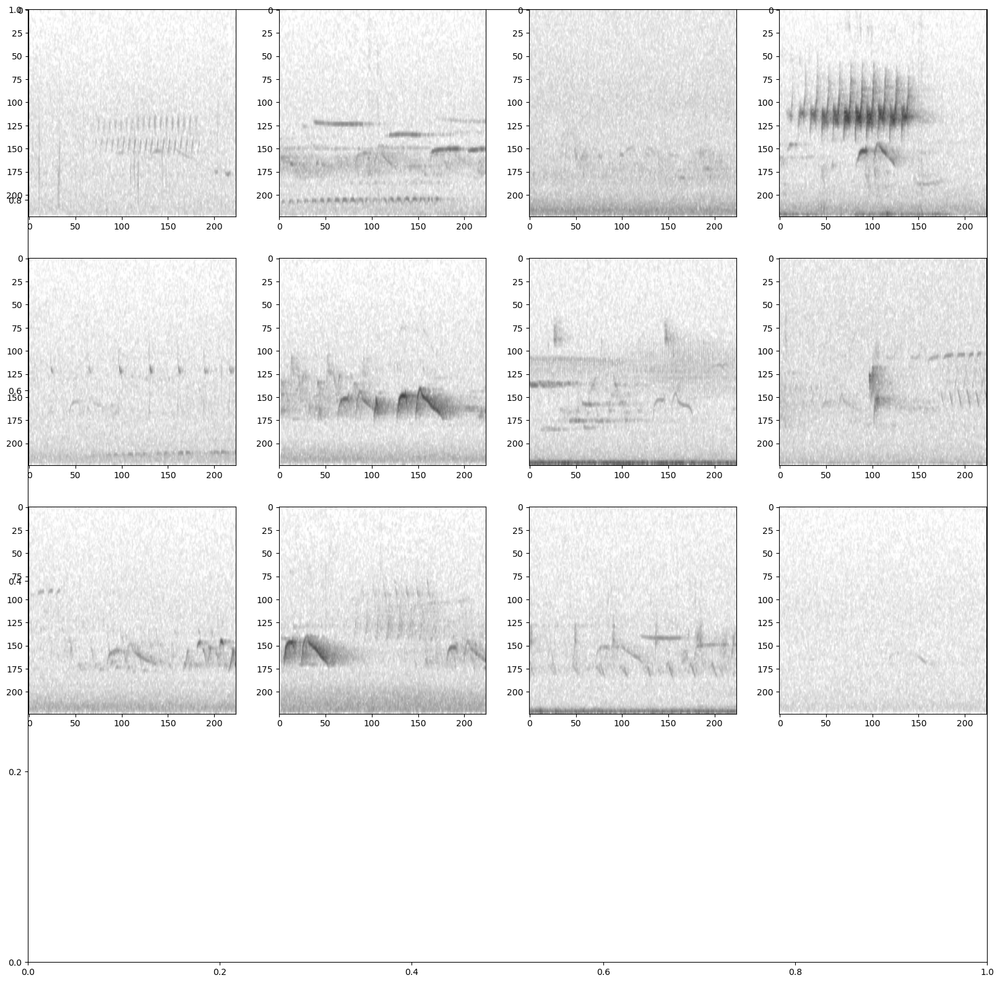

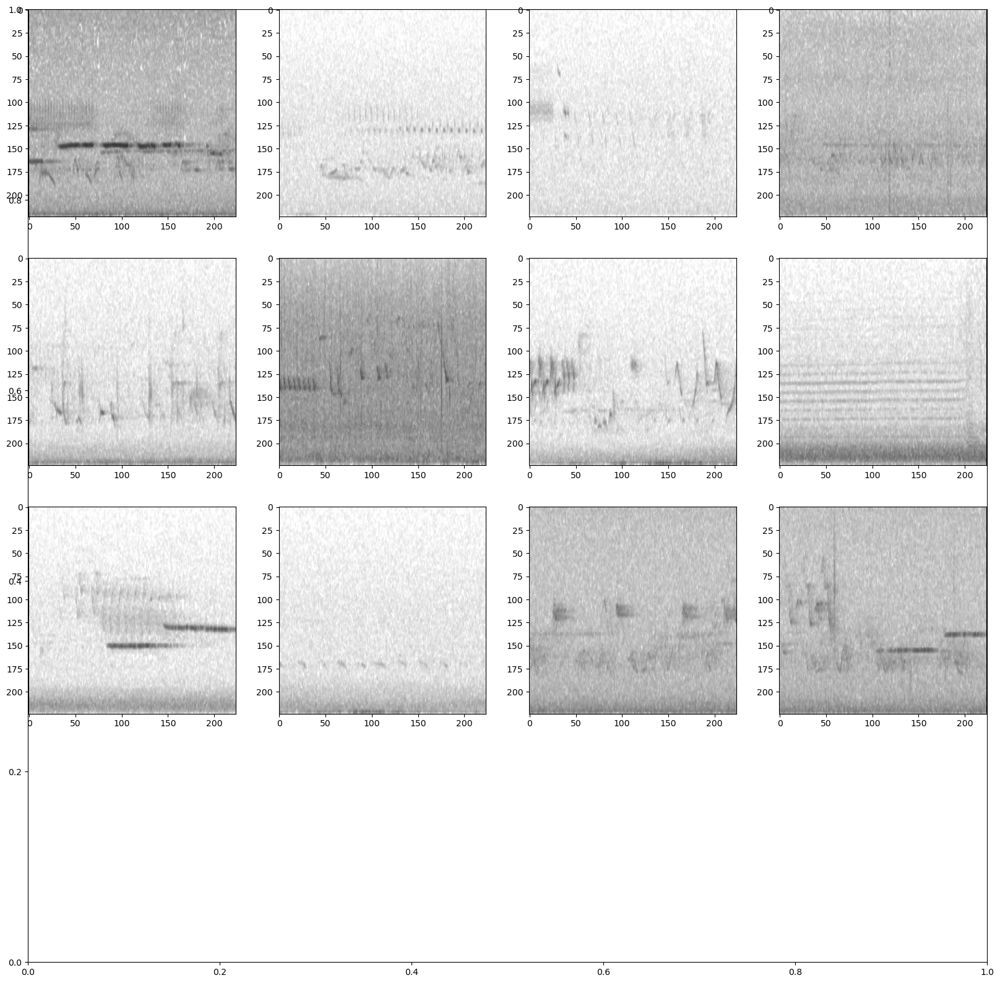

In [12]:
inspect_input_samples(train_ds, valid_ds, model)

# Train the model

In [36]:
# Train the model
model.train(
    train_ds,
    valid_ds,
    epochs = epochs,
    batch_size = 64,
    num_workers = 4, # parallelized cpu tasks for prep. Reduce if dataloader quits unexpectedly. 
    log_interval = 100,
    save_interval = 10,
    save_path=model_save_path,
    invalid_samples_log="./invalid_samples.log",
    wandb_session = wandb_session,
    )


Training Epoch 0


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch: 0 [batch 0/32, 0.00%] 
	DistLoss: 0.678
Metrics:
Metrics:
	MAP: 0.517

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.543

Training Epoch 1


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch: 1 [batch 0/32, 0.00%] 
	DistLoss: 0.686
Metrics:
Metrics:
	MAP: 0.591

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.640

Training Epoch 2


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch: 2 [batch 0/32, 0.00%] 
	DistLoss: 0.710
Metrics:
Metrics:
	MAP: 0.650

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.762

Training Epoch 3


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch: 3 [batch 0/32, 0.00%] 
	DistLoss: 0.590
Metrics:
Metrics:
	MAP: 0.740

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.898

Training Epoch 4


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch: 4 [batch 0/32, 0.00%] 
	DistLoss: 0.594
Metrics:
Metrics:
	MAP: 0.797

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.961

Training Epoch 5


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch: 5 [batch 0/32, 0.00%] 
	DistLoss: 0.596
Metrics:
Metrics:
	MAP: 0.848

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.972

Training Epoch 6


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch: 6 [batch 0/32, 0.00%] 
	DistLoss: 0.527
Metrics:
Metrics:
	MAP: 0.861

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.982

Training Epoch 7


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch: 7 [batch 0/32, 0.00%] 
	DistLoss: 0.401
Metrics:
Metrics:
	MAP: 0.887

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.980

Training Epoch 8


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch: 8 [batch 0/32, 0.00%] 
	DistLoss: 0.321
Metrics:
Metrics:
	MAP: 0.907

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.988

Training Epoch 9


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch: 9 [batch 0/32, 0.00%] 
	DistLoss: 0.348
Metrics:
Metrics:
	MAP: 0.910

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.990

Best Model Appears at Epoch 9 with Validation score 0.990.


# If you get an error saying sample is shorter than expected duration:
Add the following code to the audio.py file to get the error samples saved to short_samples.log

``` python3

```
Then run the notebook again to remove the samples from the dataset. 

# Show the locations of the data used to train the model

/Users/mikeg/code/machine_learning/osfl_cnn_recognizer/src/utils.py:220: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  points.plot(


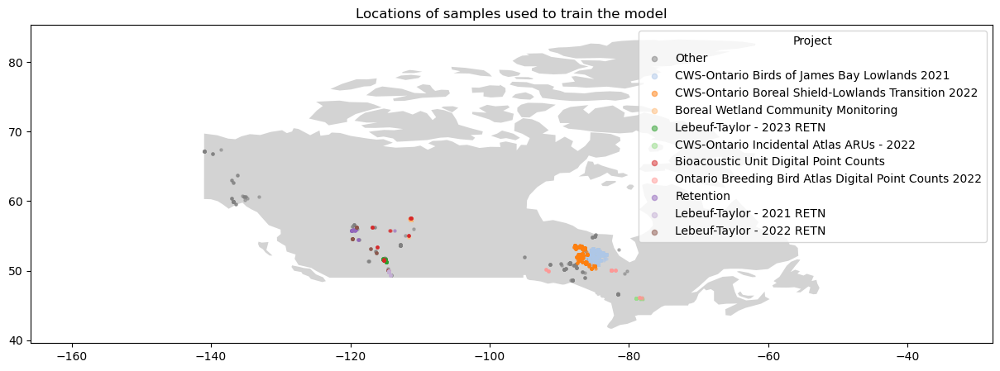

In [15]:
plot_locations(train_df.loc[train_ds.index], title="Locations of samples used to train the model")

/Users/mikeg/code/machine_learning/osfl_cnn_recognizer/src/utils.py:220: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  points.plot(


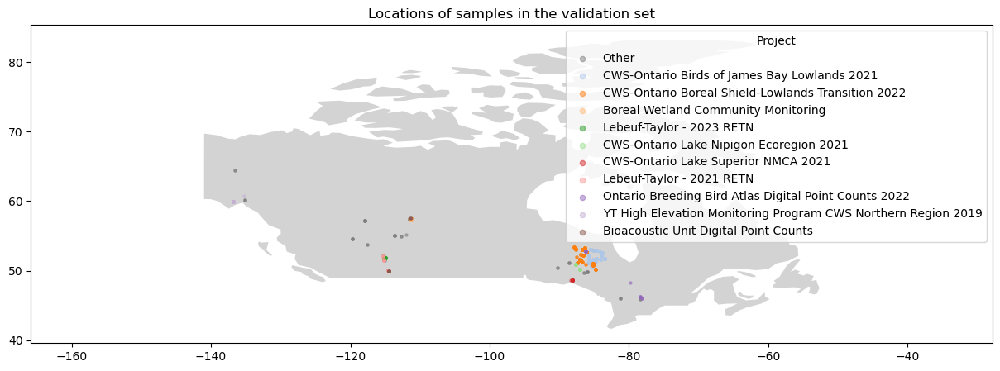

In [16]:
plot_locations(valid_df.loc[valid_ds.index], title="Locations of samples in the validation set")

# Plot confusion matrix

In [ ]:
predictions = model.predict(valid_ds, batch_size=64, num_workers=4)

# replace the predicitons made with the previous model with the new predictions
valid_df['predicted'] = predictions

  0%|          | 0/13 [00:00<?, ?it/s]

In [21]:

def plot_confusion_matrix(threshold=0.5):
    preds, targets, scores = get_binary_targets_scores(valid_df, predictions, threshold)
    # plot confusion matrix
    cm = confusion_matrix(targets, preds)
    _ = ConfusionMatrixDisplay(cm).plot(colorbar=False)
interact(plot_confusion_matrix, threshold=(0.0, 1.0, 0.01))

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.01), Output()), _dom_cla…

<function __main__.plot_confusion_matrix(threshold=0.5)>

# View the errors
The model made some errors - let's take a look at these and see what kinds of samples lead to these errors

In [28]:
# Collect the errors
false_positives = valid_df.loc[valid_df.predicted >= 0.5].loc[valid_df['target_present'] == 0]
false_negatives = valid_df.loc[valid_df.predicted < 0.5].loc[valid_df['target_present'] == 1]

## Show the false positives

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


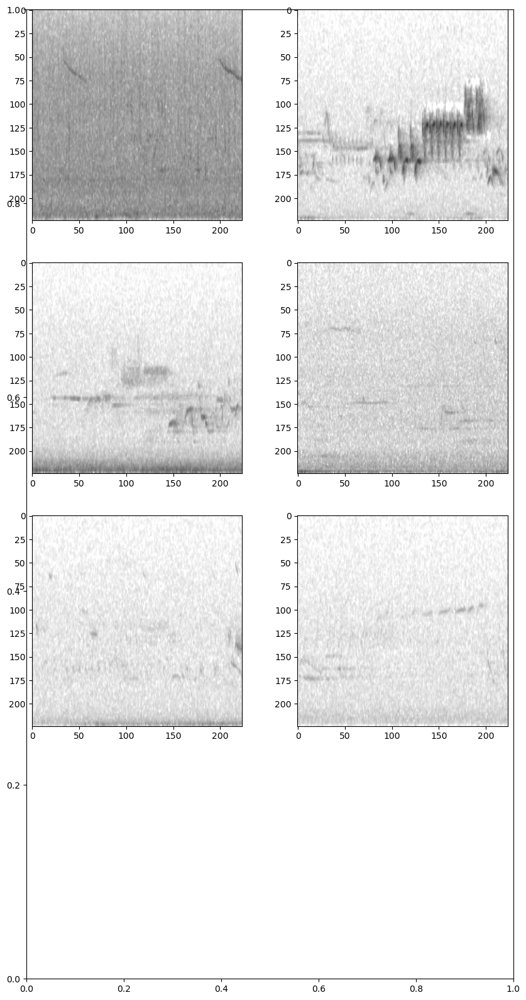

In [30]:
show_samples_in_df(false_positives, model)

## Show the false negatives

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

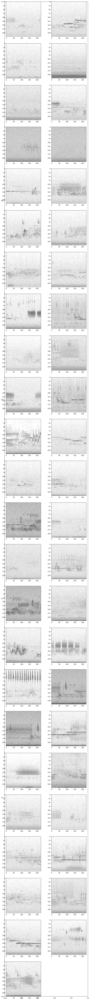

In [31]:
show_samples_in_df(false_negatives, model)

## Weights & Biases makes a memorable name for each model training run.

In [45]:
wandb.run.name

'whole-aardvark-191'

# Save the model under this name

In [46]:
model.save(model_save_path / f"{wandb.run.name}.model")